In [0]:
from google.colab import drive

drive.mount('/content/gdrive', force_remount = True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
!pip install torchvision
import torch
import torch.nn as nn
import torch.utils as utils
import torch.nn.init as init
from torch.autograd import Variable
import torchvision.utils as v_utils
import torchvision.datasets as dset
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import cv2
from collections import OrderedDict

### Hyperparameter

In [0]:
epoch = 100
batch_size = 128
learning_rate = 0.0002
num_gpus = 1
image_size= 64

### Data Load

In [0]:
!unzip "./gdrive/My Drive/data/celeba/celeba.zip"

Archive:  ./gdrive/My Drive/data/celeba/celeba.zip
   creating: img_align_celeba/
 extracting: img_align_celeba/000001.jpg  
 extracting: img_align_celeba/000002.jpg  
 extracting: img_align_celeba/000003.jpg  
 extracting: img_align_celeba/000004.jpg  
 extracting: img_align_celeba/000005.jpg  
 extracting: img_align_celeba/000006.jpg  
 extracting: img_align_celeba/000007.jpg  
 extracting: img_align_celeba/000008.jpg  
 extracting: img_align_celeba/000009.jpg  
 extracting: img_align_celeba/000010.jpg  
 extracting: img_align_celeba/000011.jpg  
 extracting: img_align_celeba/000012.jpg  
 extracting: img_align_celeba/000013.jpg  
 extracting: img_align_celeba/000014.jpg  
 extracting: img_align_celeba/000015.jpg  
 extracting: img_align_celeba/000016.jpg  
 extracting: img_align_celeba/000017.jpg  
 extracting: img_align_celeba/000018.jpg  
 extracting: img_align_celeba/000019.jpg  
 extracting: img_align_celeba/000020.jpg  
 extracting: img_align_celeba/000021.jpg  
 extracting: im

In [0]:
!ls

gdrive	img_align_celeba  sample_data


In [0]:
# root_dir = "./gdrive/My Drive/data/celeba/"

dataset = dset.ImageFolder(root="./",
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=1)

### Generator

In [0]:
ngf = 64
class Generator(nn.Module):
    def __init__(self):
        super(Generator,self).__init__()
        self.layer1 = nn.Sequential(
             nn.ConvTranspose2d(100,ngf*8,4,1,0,bias=False),
             nn.BatchNorm2d(ngf*8),
             nn.ReLU(True),
        )
        self.layer2 = nn.Sequential(OrderedDict([
                        ('conv1', nn.ConvTranspose2d(ngf*8,ngf*4,4,2,1,bias=False)),
                        ('bn1', nn.BatchNorm2d(ngf*4)),
                        ('relu1', nn.LeakyReLU()),
                        ('conv2', nn.ConvTranspose2d(ngf*4,ngf*2,4,2,1, bias=False)),
                        ('bn2', nn.BatchNorm2d(ngf*2)),    
                        ('relu2', nn.LeakyReLU()),
            ]))
        self.layer3 = nn.Sequential(OrderedDict([
                        ('conv3',nn.ConvTranspose2d(ngf*2,ngf,4,2,1, bias=False)),
                        ('bn3',nn.BatchNorm2d(ngf)),    
                        ('relu3',nn.LeakyReLU()),
                        ('conv4',nn.ConvTranspose2d(ngf,3,4,2,1,bias=False)),
                        ('relu4',nn.Tanh())
            ]))

    def forward(self,z):
        out = self.layer1(z)
        # out = out.view(batch_size//num_gpus,256,7,7)
        out = self.layer2(out)
        out = self.layer3(out)
        return out

### Discriminator

In [0]:
ndf = 64
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator,self).__init__()
        self.layer1 = nn.Sequential(OrderedDict([
                        ('conv1',nn.Conv2d(3,ndf,4,2,1,bias=False)),   # batch x 16 x 28 x 28
                        #('bn1',nn.BatchNorm2d(8)),    
                        ('relu1',nn.LeakyReLU(0.2, inplace=True)),
                        ('conv2',nn.Conv2d(ndf,ndf*2,4,2,1,bias=False)),  # batch x 32 x 28 x 28
                        ('bn2',nn.BatchNorm2d(ndf*2)),    
                        ('relu2',nn.LeakyReLU(0.2, inplace=True))
        ]))
        self.layer2 = nn.Sequential(OrderedDict([
                        ('conv3',nn.Conv2d(ndf*2,ndf*4,4,2,1, bias=False)),  # batch x 64 x 14 x 14
                        ('bn3',nn.BatchNorm2d(ndf*4)),
                        ('relu3',nn.LeakyReLU(0.2, inplace=True)),
                        # ('max2',nn.MaxPool2d(2,2)),
                        ('conv4',nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False)),  # batch x 128 x 7 x 7
                        ('bn4',nn.BatchNorm2d(ndf*8)),
                        ('relu4',nn.LeakyReLU(0.2, inplace=True))
        ]))
        self.fc = nn.Sequential(
                        nn.Conv2d(ndf*8,1,4,1,0,bias=False),
                        nn.Sigmoid()
        )

    def forward(self,x):
        out = self.layer1(x)
        out = self.layer2(out)
        # out = out.view(batch_size//num_gpus, -1)
        out = self.fc(out)

        return out.view(-1,1).squeeze(1)
        # return out

### Check Layers

In [66]:
generator = nn.DataParallel(Generator()).cuda()
discriminator = nn.DataParallel(Discriminator()).cuda()

# 파라미터 확인하기 using class.state_dict().keys

gen_params = generator.state_dict().keys()
dis_params = discriminator.state_dict().keys()

for i in dis_params:
  print(i)

module.layer1.conv1.weight
module.layer1.conv2.weight
module.layer1.bn2.weight
module.layer1.bn2.bias
module.layer1.bn2.running_mean
module.layer1.bn2.running_var
module.layer1.bn2.num_batches_tracked
module.layer2.conv3.weight
module.layer2.bn3.weight
module.layer2.bn3.bias
module.layer2.bn3.running_mean
module.layer2.bn3.running_var
module.layer2.bn3.num_batches_tracked
module.layer2.conv4.weight
module.layer2.bn4.weight
module.layer2.bn4.bias
module.layer2.bn4.running_mean
module.layer2.bn4.running_var
module.layer2.bn4.num_batches_tracked
module.fc.0.weight


### Loss Function & Optimizer

In [0]:
loss_func = nn.BCELoss()
gen_optim = torch.optim.Adam(generator.parameters(), lr= 5*learning_rate,betas=(0.5,0.999))
dis_optim = torch.optim.Adam(discriminator.parameters(), lr=learning_rate,betas=(0.5,0.999))

# def image_check(gen_fake):
#     img = gen_fake.data.numpy()
#     for i in range(10):
#         plt.imshow(cv2.cvtColor(img[i][0], cv2.COLOR_BGR2RGB))
#         plt.show()

# def image_check(gen_fake):
#     img = gen_fake.data.numpy()
#     fig, axs = plt.subplots(3,3, figsize=(10,10))
#     axs = axs.ravel()
#     for i in range(9):
#         t_img = np.moveaxis(img[i], 0, -1) *(-1)
#         axs[i].imshow(cv2.cvtColor(t_img, cv2.COLOR_BGR2RGB))
#     plt.show()

def image_check(gen_fake):
    img = gen_fake.data.numpy()
    fig, axs = plt.subplots(3,3, figsize=(10,10))
    axs = axs.ravel()
    for i in range(9):
        t_img = np.moveaxis(img[i], 0, -1)
        t_img = (((t_img - t_img.min()) * 255) / (t_img.max() - t_img.min())).astype(np.uint8)
        axs[i].imshow(t_img, cmap=None, aspect="equal")
    plt.show()

### Train Model

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([128])) that is different to the input size (torch.Size([128, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


skip


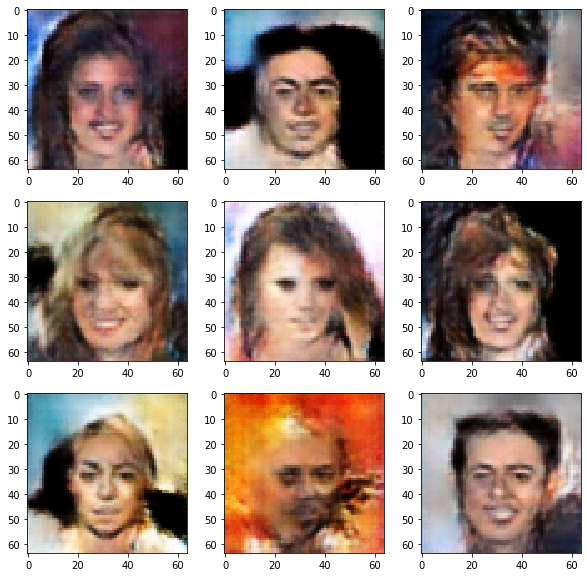

1th iteration gen_loss: 3.815849781036377 dis_loss: 1.7455109357833862
1th iteration gen_loss: 3.3812222480773926 dis_loss: 1.3081283569335938
1th iteration gen_loss: 2.1792802810668945 dis_loss: 0.8101277351379395
1th iteration gen_loss: 2.4054768085479736 dis_loss: 0.4143313765525818
1th iteration gen_loss: 2.975476026535034 dis_loss: 1.377090573310852
1th iteration gen_loss: 1.5586925745010376 dis_loss: 1.116257905960083
1th iteration gen_loss: 3.8964059352874756 dis_loss: 1.6513084173202515
1th iteration gen_loss: 3.6185925006866455 dis_loss: 2.0432164669036865
1th iteration gen_loss: 1.277267575263977 dis_loss: 0.800324022769928
1th iteration gen_loss: 3.1711924076080322 dis_loss: 1.978523850440979
1th iteration gen_loss: 3.4434962272644043 dis_loss: 1.2633177042007446
1th iteration gen_loss: 2.098989486694336 dis_loss: 0.6299296021461487
1th iteration gen_loss: 1.188677191734314 dis_loss: 0.9775053262710571
1th iteration gen_loss: 1.1616435050964355 dis_loss: 0.8343047499656677
1

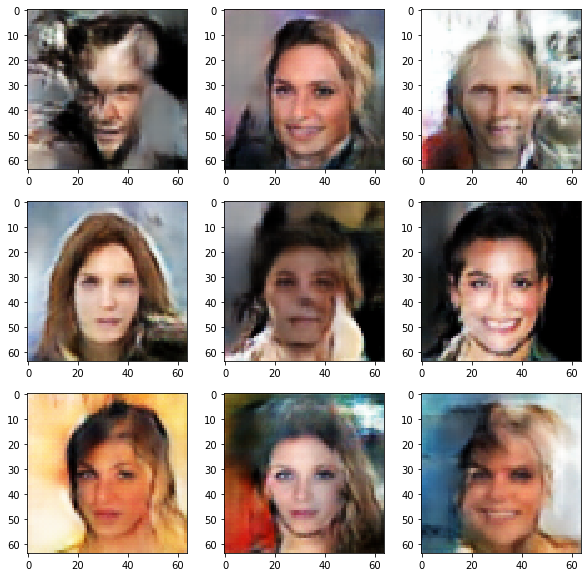

2th iteration gen_loss: 4.576841354370117 dis_loss: 2.213801622390747
2th iteration gen_loss: 2.4485363960266113 dis_loss: 0.4237986207008362
2th iteration gen_loss: 2.9270544052124023 dis_loss: 0.9847649335861206
2th iteration gen_loss: 3.799804210662842 dis_loss: 1.583053708076477
2th iteration gen_loss: 3.3769330978393555 dis_loss: 1.1771727800369263
2th iteration gen_loss: 3.518146276473999 dis_loss: 0.5566056966781616
2th iteration gen_loss: 2.390899658203125 dis_loss: 0.6734572052955627
2th iteration gen_loss: 2.5246920585632324 dis_loss: 0.48598164319992065
2th iteration gen_loss: 3.099881887435913 dis_loss: 0.9751571416854858
2th iteration gen_loss: 2.4228100776672363 dis_loss: 0.5294910669326782
2th iteration gen_loss: 2.341525077819824 dis_loss: 0.8686724901199341
2th iteration gen_loss: 2.330230236053467 dis_loss: 0.5539124011993408
2th iteration gen_loss: 2.1788322925567627 dis_loss: 0.4692739248275757
2th iteration gen_loss: 4.124834060668945 dis_loss: 1.1519453525543213
2

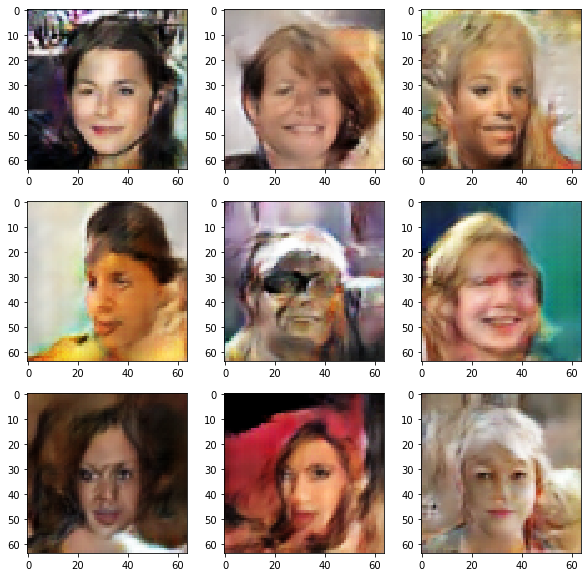

3th iteration gen_loss: 2.1810216903686523 dis_loss: 0.5441641807556152
3th iteration gen_loss: 2.6169235706329346 dis_loss: 0.43619048595428467
3th iteration gen_loss: 3.6716880798339844 dis_loss: 0.7754303812980652
3th iteration gen_loss: 3.260193347930908 dis_loss: 0.626304030418396
3th iteration gen_loss: 2.3845438957214355 dis_loss: 0.5966091752052307
3th iteration gen_loss: 3.501131534576416 dis_loss: 1.0428736209869385
3th iteration gen_loss: 2.2669029235839844 dis_loss: 0.6201149225234985
3th iteration gen_loss: 3.532904624938965 dis_loss: 0.8937564492225647
3th iteration gen_loss: 4.135642051696777 dis_loss: 1.0464287996292114
3th iteration gen_loss: 3.3444042205810547 dis_loss: 0.5565267205238342
3th iteration gen_loss: 3.39054536819458 dis_loss: 0.5354403853416443
3th iteration gen_loss: 3.564112663269043 dis_loss: 0.631452739238739
3th iteration gen_loss: 2.1423895359039307 dis_loss: 0.47801804542541504
3th iteration gen_loss: 2.9148528575897217 dis_loss: 0.4218555092811584

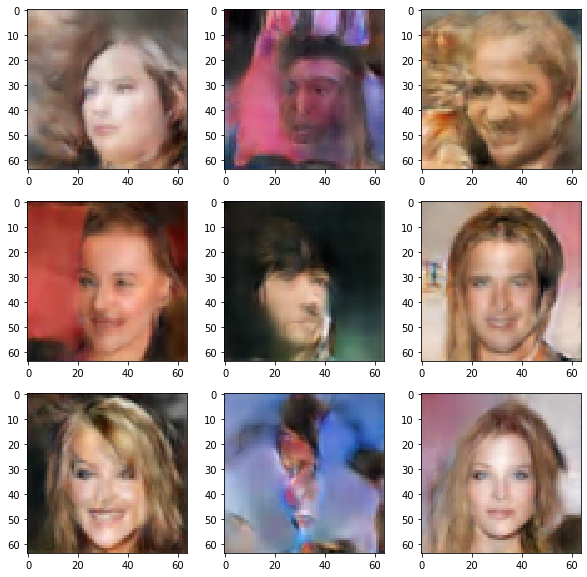

4th iteration gen_loss: 3.557539939880371 dis_loss: 0.22462725639343262
4th iteration gen_loss: 2.128668785095215 dis_loss: 0.4657456874847412
4th iteration gen_loss: 4.23991584777832 dis_loss: 1.3030564785003662
4th iteration gen_loss: 3.4792020320892334 dis_loss: 0.6262621283531189
4th iteration gen_loss: 2.9571285247802734 dis_loss: 0.7135745286941528
4th iteration gen_loss: 3.1118087768554688 dis_loss: 0.8210513591766357
4th iteration gen_loss: 4.214559555053711 dis_loss: 0.9951483607292175
4th iteration gen_loss: 2.614217758178711 dis_loss: 0.4019746482372284
4th iteration gen_loss: 1.6545852422714233 dis_loss: 0.7208480834960938
4th iteration gen_loss: 2.51631498336792 dis_loss: 0.32339271903038025
4th iteration gen_loss: 3.422032356262207 dis_loss: 0.7610241174697876
4th iteration gen_loss: 2.695298433303833 dis_loss: 0.5853736996650696
4th iteration gen_loss: 1.8848295211791992 dis_loss: 0.5455982685089111
4th iteration gen_loss: 3.0123534202575684 dis_loss: 0.41969919204711914

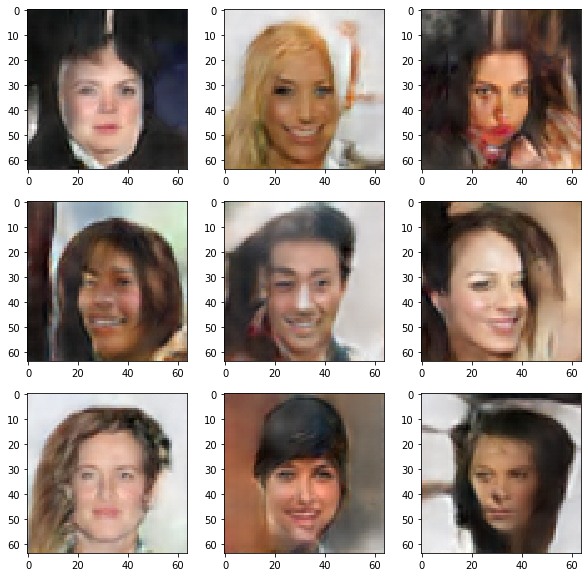

5th iteration gen_loss: 2.0364091396331787 dis_loss: 0.4542383551597595
5th iteration gen_loss: 2.11928653717041 dis_loss: 0.6500793695449829
5th iteration gen_loss: 2.9306790828704834 dis_loss: 0.6782374978065491
5th iteration gen_loss: 2.3020386695861816 dis_loss: 0.4536650478839874
5th iteration gen_loss: 3.7122766971588135 dis_loss: 0.569878101348877
5th iteration gen_loss: 2.496302604675293 dis_loss: 0.4357888996601105
5th iteration gen_loss: 2.3496172428131104 dis_loss: 0.4325299859046936
5th iteration gen_loss: 5.490635871887207 dis_loss: 1.9432963132858276
5th iteration gen_loss: 3.332775831222534 dis_loss: 0.42428937554359436
5th iteration gen_loss: 3.362199306488037 dis_loss: 0.26730430126190186
5th iteration gen_loss: 2.562675714492798 dis_loss: 0.47964125871658325
5th iteration gen_loss: 3.317532539367676 dis_loss: 0.46964022517204285
5th iteration gen_loss: 2.535787582397461 dis_loss: 0.4507240951061249
5th iteration gen_loss: 3.720931053161621 dis_loss: 0.5978440046310425

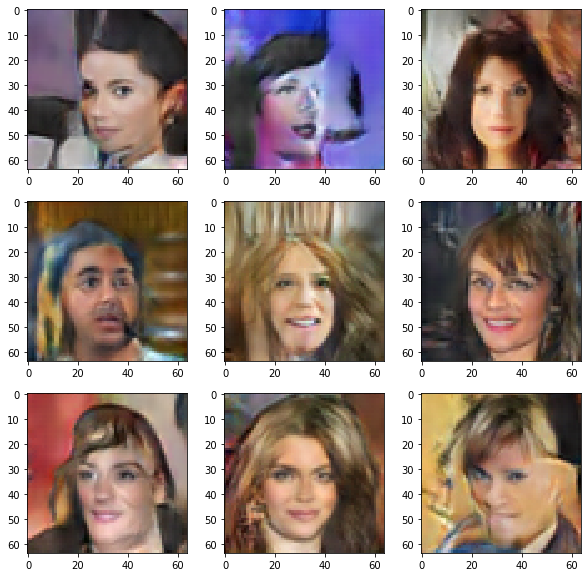

6th iteration gen_loss: 2.329756259918213 dis_loss: 0.390510618686676
6th iteration gen_loss: 6.408937454223633 dis_loss: 1.3660931587219238
6th iteration gen_loss: 0.5172901153564453 dis_loss: 1.2561808824539185
6th iteration gen_loss: 3.3419108390808105 dis_loss: 0.23337942361831665
6th iteration gen_loss: 3.45668888092041 dis_loss: 0.38704782724380493
6th iteration gen_loss: 3.1482033729553223 dis_loss: 0.38126784563064575
6th iteration gen_loss: 2.850112199783325 dis_loss: 0.30302566289901733
6th iteration gen_loss: 2.7393903732299805 dis_loss: 0.4255415201187134
6th iteration gen_loss: 2.8905649185180664 dis_loss: 0.30364859104156494
6th iteration gen_loss: 3.2406365871429443 dis_loss: 0.3766971230506897
6th iteration gen_loss: 3.1052050590515137 dis_loss: 0.37866050004959106
6th iteration gen_loss: 3.1852166652679443 dis_loss: 0.3678947985172272
6th iteration gen_loss: 2.8256492614746094 dis_loss: 0.6534030437469482
6th iteration gen_loss: 3.524260997772217 dis_loss: 0.6226934790

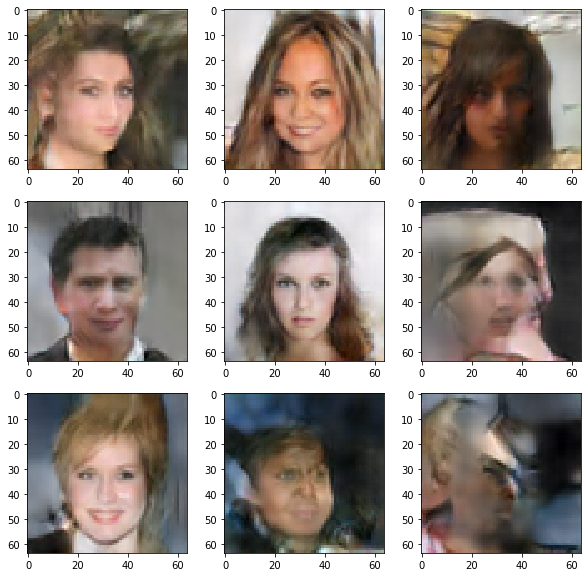

7th iteration gen_loss: 1.328000783920288 dis_loss: 0.6226524710655212
7th iteration gen_loss: 3.972179651260376 dis_loss: 0.5467471480369568
7th iteration gen_loss: 2.964181900024414 dis_loss: 0.26243239641189575
7th iteration gen_loss: 3.5185444355010986 dis_loss: 0.49565452337265015
7th iteration gen_loss: 3.6372759342193604 dis_loss: 0.48053479194641113
7th iteration gen_loss: 4.084252834320068 dis_loss: 0.2818250358104706
7th iteration gen_loss: 3.826211929321289 dis_loss: 0.3230496942996979
7th iteration gen_loss: 2.5382378101348877 dis_loss: 0.4260852038860321
7th iteration gen_loss: 4.385863304138184 dis_loss: 0.4020244777202606
7th iteration gen_loss: 2.431662082672119 dis_loss: 0.443585604429245


In [0]:
for i in range(epoch):
    for j,data in enumerate(train_loader):
        #discriminator update: maximize log(D(x)) + log(1-D(z))
        if data[0].size(0) != batch_size:
          print("skip")
          continue

        else:
          dis_optim.zero_grad()
          image = data[0].cuda()
          b_size = image.size(0)
          label = torch.full((b_size,), real_label).cuda()
          dis_real = discriminator.forward(image).view(-1,1)
          dis_real_error = torch.sum(loss_func(dis_real,label)) #진짜를 진짜와 비교했을 때 에러값
          dis_real_error.backward()
          dis_optim.step()


          z = Variable(torch.Tensor(batch_size,100,1,1).normal_(0,1)).cuda() #noise
          gen_fake = generator.forward(z) #generator로 생성한 fake image
          label.fill_(fake_label)
          dis_fake = discriminator.forward(gen_fake.detach()).view(-1,1) #fake를 discriminate
          dis_fake_error = torch.sum(loss_func(dis_fake,label)) #fake를 fake라고 한 error
          dis_fake_error.backward() 

          #최종 loss 값
          dis_loss = dis_real_error + dis_fake_error #진짜를 진짜로, 가짜를 가짜로 한 거. loss가 적어야 discriminator가 제대로 작동하지 않는 거
          dis_optim.step()


          #generator update 하기
          gen_optim.zero_grad()
          label.fill_(real_label)
          gen_dis_fake = discriminator.forward(gen_fake).view(-1,1) 
          gen_loss = torch.sum(loss_func(gen_dis_fake, label)) #가짜를 진짜라고 한 에러. 낮아야 generator가 제대로 작동한 거
          gen_loss.backward()
          gen_optim.step()
      
          # model save
          if i!=0 and j % 100 == 0:
              # print(gen_loss,dis_loss)
              # torch.save([generator,discriminator],'./model/dcgan.pkl')

              print("{}th iteration gen_loss: {} dis_loss: {}".format(i,gen_loss.data,dis_loss.data))
              # v_utils.save_image(gen_fake.data[0:25],"/content/gdrive/data/result/gen_{}_{}.png".format(i,j), nrow=5)
            
    image_check(gen_fake.cpu())

In [0]:
# for i in range(epoch):
#     for j,(image,label) in enumerate(train_loader):
#         image = Variable(image).cuda()
        
#         # generator
#         gen_optim.zero_grad()
        
#         z = Variable(torch.Tensor(batch_size,100,1,1).normal_(0,1)).cuda()
#         gen_fake = generator.forward(z) #만들어진 fake image
#         dis_fake = discriminator.forward(gen_fake).view(-1,1)  #fake를 discriminator로 classify
        
#         gen_loss = torch.sum(loss_func(dis_fake,ones_label)) # 진짜라고 classified된 fake image(낮을 수록 학습 잘 됨)
#         gen_loss.backward(retain_graph=True)
#         gen_optim.step()
    
#         # discriminator
#         dis_optim.zero_grad()
        
#         z = Variable(torch.Tensor(batch_size,100,1,1).normal_(0,1)).cuda()
#         gen_fake = generator.forward(z)
#         dis_fake = discriminator.forward(gen_fake).view(-1,1)
#         dis_real = discriminator.forward(image).view(-1,1) #진짜 이미지를 진짜라고 classify          
#         dis_loss = torch.sum(loss_func(dis_fake,zeros_label)) + torch.sum(loss_func(dis_real,ones_label)) #가짜를 가짜라고, 진짜를 진짜라고 한 거. 높을수록 학습 잘 된거 
#         dis_loss.backward()
#         dis_optim.step()
    
#         # model save
#         if i!=0 and j % 100 == 0:
#             # print(gen_loss,dis_loss)
#             # torch.save([generator,discriminator],'./model/dcgan.pkl')

#             print("{}th iteration gen_loss: {} dis_loss: {}".format(i,gen_loss.data,dis_loss.data))
#             # v_utils.save_image(gen_fake.data[0:25],"/content/gdrive/data/result/gen_{}_{}.png".format(i,j), nrow=5)
            
#     image_check(gen_fake.cpu())